# Define the path to store the downloaded data

In [1]:
# define the path of the data and project
proj_path = 'D:/VScode/MRes/Clustering_under_the_ice/'
data_path = 'D:/VScode/MRes/scienceweb.whoi.edu/itp/data/'

# Download the ITP data

In [6]:
#download zip data

import requests
from bs4 import BeautifulSoup
import os

'''get the filename list for files end with 'final.tar.Z' from the url'''
def get_webfile_name(url):
    response = requests.get(url)
    soup = BeautifulSoup(response.text, 'html.parser')
    file_name = []
    for link in soup.find_all('a'):
        if link.get('href').endswith('final.tar.Z'):
            file_name.append(link.get('href'))
    return file_name

url = 'https://scienceweb.whoi.edu/itp/data/'
file_name = get_webfile_name(url)

# file_name = [name.replace('_1', '') if '_1final.tar.Z' in name else name for name in file_name]

# check whether files on the online website exist in the data folder
def check_file(file_name):
    not_downloaded_files = []
    for i in file_name:
        file_path = os.path.join(data_path, i)
        if not os.path.exists(file_path):
            not_downloaded_files.append(i)
    return not_downloaded_files

file_name = check_file(file_name)

#download the files if the file_name list is not empty
def download_file(file_name,url):
    os.chdir(data_path)
    for i in file_name:
        file_url = url + i
        print(f' File {i} does not exist. Downloading...')
        response = requests.get(file_url)
        with open(i, 'wb') as f:
            f.write(response.content)
    os.chdir(proj_path)
    print('Download complete')

if len(file_name) > 0:
    download_file(file_name,url)
else:
    print('All .tar.Z files exist')

 File itp39_1final.tar.Z does not exist. Downloading...
Download complete


# Rename itp39_1final.tar.Z to itp39final.tar.Z, to align the file name with others

In [9]:
# readname the tar.Z files with _1 in the name
if os.path.exists(data_path+'/itp39_1final.tar.Z'):
    if os.path.exists(data_path+'/itp39final.tar.Z'):
        os.remove(data_path+'/itp39final.tar.Z')
    else:
        os.rename(data_path+'/itp39_1final.tar.Z', data_path+'/itp39final.tar.Z')
        print('rename itp39_1final.tar.Z to itp39final.tar.Z')
else:
    print('itp39_1final.tar.Z does not exist')

rename itp39_1final.tar.Z to itp39final.tar.Z


# Extract the .dat files from zip files

In [10]:
import os
from pyunpack import Archive
import re

# Define a set to keep track of the sensor numbers of the .dat files that have been extracted
extracted_sensors = set()

# Loop over all the .dat files in the data directory to get the list of extracted sensor numbers
for file in os.listdir(data_path):
    if file.endswith('.dat'):
        # Extract the sensor number from the file name
        sensor_num = file.split('itp')[1]
        sensor_num=re.split(r'\D+', sensor_num)[0]
        extracted_sensors.add(sensor_num)

# Extract the .tar.Z files if they are not on the extracted_sensors list
counter=0
for file in os.listdir(data_path):
    if file.endswith('.tar.Z'):
        # Extract the sensor number from the file name
        sensor_num = file.split('final')[0][3:]
        if sensor_num not in extracted_sensors:
            counter=counter+1
            try:
                # Extract the .tar.Z file
                Archive(os.path.join(data_path, file)).extractall(data_path)
                print(f'extrating {file}...')
                # Add the extracted sensor number to the extracted_sensors set
                extracted_sensors.add(sensor_num)
                
            except Exception as e:
                print(f"Error extracting {file}: {e}")
if counter==0:
    print('All files been extracted')


All files been extracted


# Process the data: data analysis
## 1. Define the function to extract the file name from its full path

In [3]:
def extract_string_from_file_path(file_path):
    # Split the file path by '/' or '\' based on the OS separator
    split_path = file_path.split('/')
    if len(split_path) == 1:
        split_path = file_path.split('\\')

    # Get the last element of the split path which is the file name
    file_name = split_path[-1]

    # Remove the file extension '.dat' from the file name
    file_name_without_extension = file_name.split('.')[0]

    # Extract the desired string using string slicing
    desired_string = file_name_without_extension[5:]
    
    return desired_string


In [15]:
x=extract_string_from_file_path(files[0]) # test the function
x

'itp100grd0001'

## 2. Data analysis: loop through all .dat files to get their information

In [4]:
# get the infromation of all data
import pandas as pd
import numpy as np
import xarray as xr

# create a pandas dataframe to store the data
df = pd.DataFrame(columns=['profiler', 'right_format','larger_1','t_xarray','date', 'lon', 'lat', 'p_start','p_end','p_len', 'is_oxy', 'oxy_len'])

import glob
files = glob.glob(f'{data_path}/*.dat')

counter=0
for file in files:
    with open(file) as infile:
        metadata_names=infile.readline()
        metadata_vals=infile.readline().split()
    df.loc[counter, 'profiler'] = extract_string_from_file_path(file)   #metadata_names.split(':')[0].split(',')[0].split(' ')[1]
    # print(metadata_names.split(':')[0].split(',')[0].split(' ')[1])
    # print(file)
    if metadata_vals[-1].isnumeric():
        df.loc[counter, 'right_format'] = 1
        # print(f'normal {metadata_vals[-1]}')
        df.loc[counter, 'larger_1'] = 1
        ind=pd.read_csv(file,sep='\s+',header=2,engine='python',skipfooter=1,index_col=0)
        try:
            ds=ind.to_xarray().rename({'%pressure(dbar)':'pressure','temperature(C)':'temperature'})
            if 'dissolved_oxygen' in ds.data_vars:
                df.loc[counter,'is_oxy'] = 1
                # get the length of the oxygen array
                df.loc[counter, 'oxy_len'] = len(ds.dissolved_oxygen.values)
            else:
                df.loc[counter,'is_oxy'] = 0
            ds = xr.Dataset({'pressure': ds['pressure'],'temperature': ds['temperature'],'salinity':ds['salinity']})
        except ValueError:
            # df.loc[counter, 't_xarray'] =0
            print('cannot convert to xarray')
            

        ds=ds.assign_coords({'profiler':int(metadata_names.split(':')[0].split(',')[0].split(' ')[1]),
                                'date':np.datetime64(pd.Timestamp(metadata_vals[0])+pd.Timedelta(float(metadata_vals[1]),'D')),
                                'lon':float(metadata_vals[2]),
                                'lat':float(metadata_vals[3])}
                                )
        ds=ds.drop_duplicates('pressure',keep='last')
        df.loc[counter, 't_xarray'] =1
        df.loc[counter, 'date'] = ds.date.values
        df.loc[counter, 'lon'] = ds.lon.values
        df.loc[counter, 'lat'] = ds.lat.values

        if int(metadata_vals[-1])>1:



            if len(ds.pressure.values)<=1:#ds.pressure.size<=1:
                df.loc[counter, 'larger_1'] = 0
            else:
                df.loc[counter,'larger_1'] = 1
                # get the first non-nan pressure value
                df.loc[counter, 'p_start'] = ds.pressure.values[~np.isnan(ds.pressure.values)][0]
                # get the last non-nan pressure value
                df.loc[counter, 'p_end'] = ds.pressure.values[~np.isnan(ds.pressure.values)][-1]
                # get the length of the pressure array
                df.loc[counter, 'p_len'] = len(ds.pressure.values)
        else:
            # print(f'not normal{metadata_vals[-1]}')
            df.loc[counter, 'larger_1'] = 0
    else:
        print(f'not numeric, encountered: {metadata_vals[-1]}')
        df.loc[counter, 'right_format'] = 0
    
    counter += 1
    # if counter==2000:
    #     break


KeyboardInterrupt: 

## 3. Informations of .dat files
The df is store the information of .dat->.nc transform, from which we can tell whether a .dat file is successfuly converted to .nc\
\
'profiler': .data (profile) file name\
'right_format': whether the .dat file got the right format, for example, some does not have the right column names\
'larger_1': does the .dat file contain more than 1 data points\
't_xarray': does the df successfully converted to xarray\
'date': date of profile been collected\
'lon': lon of profile\
'lat': lat of profil\
'p_start': start of pressure data\
'p_end': end of pressure data\
'p_len': number of data points of pressure\
'is_oxy': does the profile contain dissolved oxygen data\
'oxy_len'   dissolved oxygen data length

In [42]:
df

,profiler,right_format,larger_1,t_xarray,date,lon,lat,p_start,p_end,p_len,is_oxy,oxy_len
0,itp100grd0001,1,1,1,2017-09-20T00:02:04.416000000,-149.1544,80.0378,8.4,789.0,782,1,782
1,itp100grd0002,1,1,1,2017-09-20T06:02:01.824000000,-149.1395,80.069,34.3,761.0,728,1,728
2,itp100grd0003,1,1,1,2017-09-21T00:02:02.688000000,-148.7704,80.0992,8.3,760.6,754,1,754
3,itp100grd0004,1,1,1,2017-09-21T06:02:02.687999000,-148.5921,80.1193,32.1,760.7,730,1,730
4,itp100grd0005,1,1,1,2017-09-22T00:02:02.688000000,-147.9601,80.1768,8.5,752.0,745,1,745
...,...,...,...,...,...,...,...,...,...,...,...,...
106008,itp9grd1087,1,1,1,2009-01-10T00:24:16.704000000,-96.7784,82.6742,397.0,790.0,394,0,NaN
106009,itp9grd1096,1,1,1,2009-01-14T06:24:14.112000000,-96.2705,82.6985,397.2,759.5,358,0,NaN
106010,itp9grd1097,1,1,1,2009-01-15T00:24:18.432000000,-95.5062,82.7462,6.8,764.3,758,0,NaN
106011,itp9grd1099,1,1,1,2009-01-15T07:12:01.728000000,-95.2933,82.7572,6.7,663.6,658,0,NaN


In [35]:
df[df.right_format==0].profiler  #total 20 profiles

Series([], Name: profiler, dtype: object)

In [6]:
df[df.t_xarray=='nan'].profiler  

Series([], Name: profiler, dtype: object)

In [7]:
df[df.larger_1==0].profiler 

Series([], Name: profiler, dtype: object)

In [43]:
# write df to csv
df.to_csv(f'{data_path}/df.csv',index=False)

In [2]:
# read the df from local file
import pandas as pd
df = pd.read_csv(f'{data_path}/df.csv')


In [4]:
df

,profiler,right_format,larger_1,t_xarray,date,lon,lat,p_start,p_end,p_len,is_oxy,oxy_len
0,itp100grd0001,1,1.0,1.0,2017-09-20T00:02:04.416000000,-149.1544,80.0378,8.4,789.0,782.0,1.0,782.0
1,itp100grd0002,1,1.0,1.0,2017-09-20T06:02:01.824000000,-149.1395,80.0690,34.3,761.0,728.0,1.0,728.0
2,itp100grd0003,1,1.0,1.0,2017-09-21T00:02:02.688000000,-148.7704,80.0992,8.3,760.6,754.0,1.0,754.0
3,itp100grd0004,1,1.0,1.0,2017-09-21T06:02:02.687999000,-148.5921,80.1193,32.1,760.7,730.0,1.0,730.0
4,itp100grd0005,1,1.0,1.0,2017-09-22T00:02:02.688000000,-147.9601,80.1768,8.5,752.0,745.0,1.0,745.0
...,...,...,...,...,...,...,...,...,...,...,...,...
106008,itp9grd1087,1,1.0,1.0,2009-01-10T00:24:16.704000000,-96.7784,82.6742,397.0,790.0,394.0,0.0,NaN
106009,itp9grd1096,1,1.0,1.0,2009-01-14T06:24:14.112000000,-96.2705,82.6985,397.2,759.5,358.0,0.0,NaN
106010,itp9grd1097,1,1.0,1.0,2009-01-15T00:24:18.432000000,-95.5062,82.7462,6.8,764.3,758.0,0.0,NaN
106011,itp9grd1099,1,1.0,1.0,2009-01-15T07:12:01.728000000,-95.2933,82.7572,6.7,663.6,658.0,0.0,NaN


## 4. print some numbers

In [46]:
# print the number of profiles not has right format, the number of profiles with pressure length less than or equals to 1, and the number of profiles with oxygen data
print(f'Number of profiles not has right format: {len(df[df.right_format==0])}')
print(f'Number of profiles with pressure length less than or equals to 1: {len(df[df.larger_1==0])}')
print(f'Number of profiles with oxygen data: {len(df[df.is_oxy==1])}')

Number of profiles not has right format: 32
Number of profiles with pressure length less than or equals to 1: 17206
Number of profiles with oxygen data: 18503


## 5. Plot some figures of the df

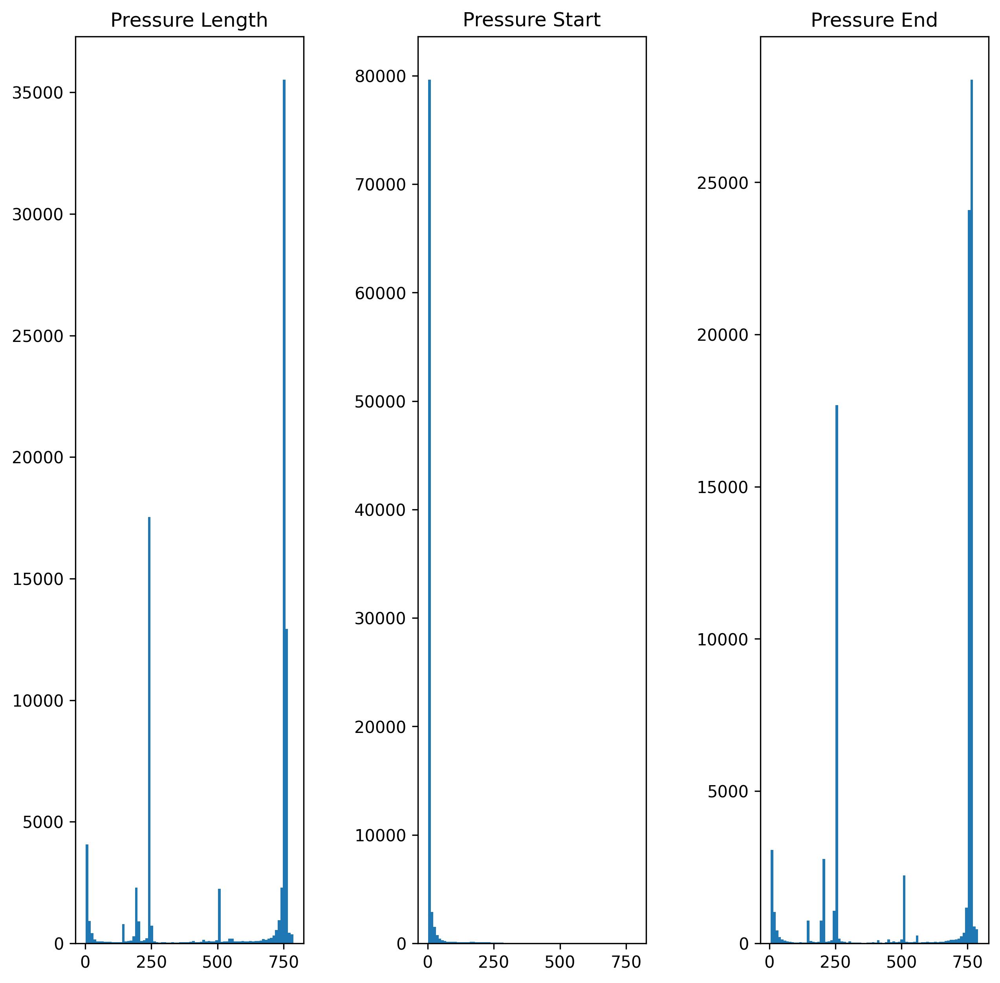

In [28]:
import matplotlib.pyplot as plt

# plot the histogram of the pressure length, pressure start, and pressure end if the value in the row is not nan using subplots with the number of bins adjusted according to the length of the data
fig, axs = plt.subplots(1, 3, figsize=(10, 10),dpi=300)
axs[0].hist(df[df.p_len.notnull()].p_len, bins=80)#int(np.sqrt(len(df[df.p_len.notnull()].p_len)))
axs[0].set_title('Pressure Length')
axs[1].hist(df[df.p_start.notnull()].p_start, bins=80)
axs[1].set_title('Pressure Start')
axs[2].hist(df[df.p_end.notnull()].p_end, bins=80)
axs[2].set_title('Pressure End')
plt.subplots_adjust(wspace=0.5)
plt.show()



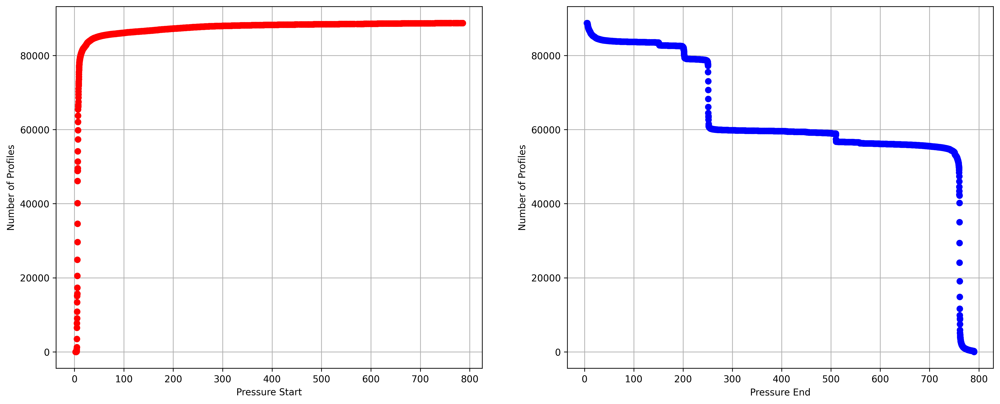

In [7]:
import matplotlib.pyplot as plt
import numpy as np

# get the non-nan unique values of the p_start and p_end columns and sort them (small to large)
p_start_unique = np.sort(df[df.p_start.notnull()].p_start.unique())
p_end_unique = np.sort(df[df.p_end.notnull()].p_end.unique())

# create a figure with 1 row and 2 columns
fig, axs = plt.subplots(1, 2, figsize=(18,7), dpi=300)
axs[0].grid()   # add grid lines to the plot
# loop through p_start_unique and make a line plot of the changes of the number of profiles with p_start >= p_start_unique
for i in range(len(p_start_unique)):
    axs[0].plot(p_start_unique[i],len(df[df.p_start<=p_start_unique[i]]),'o',c='r')
axs[0].set_xlabel('Pressure Start')
axs[0].set_ylabel('Number of Profiles')
# axs[0].set_title('Number of Profiles with Pressure Start <= Pressure Start Unique')


axs[1].grid()   # add grid lines to the plot
# loop through p_end_unique and make a line plot of the changes of the number of profiles with p_end <= p_end_unique
for i in range(len(p_end_unique)):
    axs[1].plot(p_end_unique[i],len(df[df.p_end>=p_end_unique[i]]),'o',c='b')
axs[1].set_xlabel('Pressure End')
axs[1].set_ylabel('Number of Profiles')
# axs[1].set_title('Number of Profiles with Pressure End >= Pressure End Unique')

# display the figure
plt.show()


In [57]:
#same as above but is an interactive plot
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# get the non-nan unique values of the p_start and p_end columns and sort them (small to large)
p_start_unique = np.sort(df[df.p_start.notnull()].p_start.unique())
p_end_unique = np.sort(df[df.p_end.notnull()].p_end.unique())

# create subplots with 1 row and 2 columns
fig = make_subplots(rows=1, cols=2)

# loop through p_start_unique and make a line plot of the changes of the number of profiles with p_start >= p_start_unique
fig.add_trace(
    go.Scatter(x=p_start_unique, y=[len(df[df.p_start<=p]) for p in p_start_unique], mode='markers', marker=dict(color='red')),
    row=1, col=1
)

fig.update_xaxes(title_text='Pressure Start', row=1, col=1)
fig.update_yaxes(title_text='Number of Profiles', row=1, col=1)
# fig.update_layout(title='Number of Profiles with Pressure Start >= Pressure Start')

# loop through p_end_unique and make a line plot of the changes of the number of profiles with p_end <= p_end_unique
fig.add_trace(
    go.Scatter(x=p_end_unique, y=[len(df[df.p_end>=p]) for p in p_end_unique], mode='markers', marker=dict(color='blue')),
    row=1, col=2
)

fig.update_xaxes(title_text='Pressure End', row=1, col=2)
fig.update_yaxes(title_text='Number of Profiles', row=1, col=2)
# fig.update_layout(title='Number of Profiles with Pressure End <= Pressure End')

fig.show()


In [6]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import numpy as np

# get the non-nan unique values of the p_start and p_end columns and sort them (small to large)
p_start_unique = np.sort(df[(df.p_start.notnull()) & (df.p_start >= 0) & (df.p_start <= 40)].p_start.unique())
p_end_unique = np.sort(df[df.p_end.notnull()].p_end.unique())

# create subplots with 1 row and 2 columns
fig = make_subplots(rows=1, cols=2)

# loop through p_start_unique and make a line plot of the changes of the number of profiles with p_start >= p_start_unique
fig.add_trace(
    go.Scatter(x=p_start_unique, y=[len(df[df.p_start<=p]) for p in p_start_unique], mode='markers', marker=dict(color='red')),
    row=1, col=1
)

fig.update_xaxes(title_text='Pressure Start', range=[0,50], row=1, col=1)
fig.update_yaxes(title_text='Number of Profiles', row=1, col=1)

# loop through p_end_unique and make a line plot of the changes of the number of profiles with p_end <= p_end_unique
fig.add_trace(
    go.Scatter(x=p_end_unique, y=[len(df[df.p_end>=p]) for p in p_end_unique], mode='markers', marker=dict(color='blue')),
    row=1, col=2
)

fig.update_xaxes(title_text='Pressure End', row=1, col=2)
fig.update_yaxes(title_text='Number of Profiles', row=1, col=2)

fig.show()


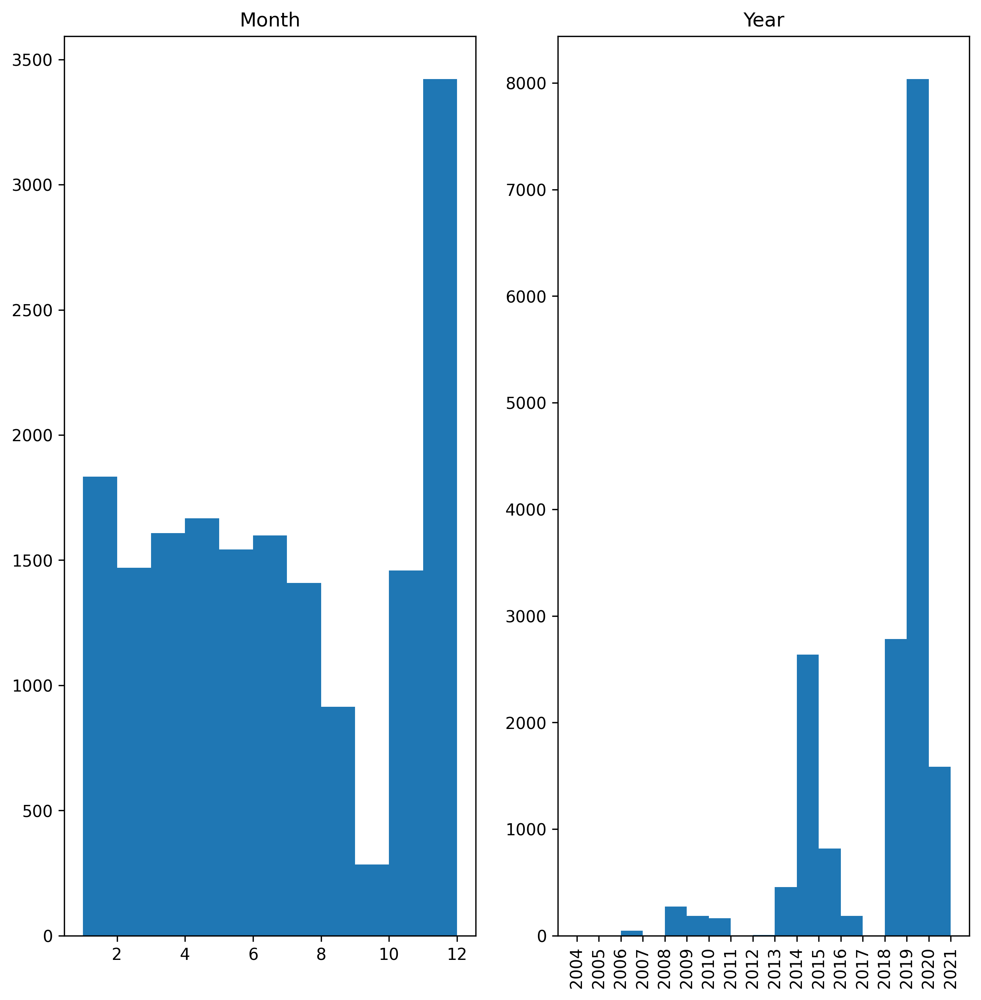

In [60]:
# if there are profiles with pressure length less than 1, plot histogram of the month and year of those profiles side by side
if len(df[df.larger_1==0])>0:

    # covert the df.date to datetime
    df.date = pd.to_datetime(df.date)
    years = df[df.larger_1==0].date.dt.year.values
    months = df[df.larger_1==0].date.dt.month.values

    fig, axs = plt.subplots(1, 2, figsize=(10, 10),dpi=300)
    bins_month = np.arange(1, 13)  # set bin edges
    axs[0].hist(df[df.larger_1==0].date.dt.month.values, bins=bins_month)
    axs[0].set_title('Month')
    bins_year = np.arange(2004, 2022)  # set bin edges
    axs[1].hist(df[df.larger_1==0].date.dt.year.values, bins=bins_year)
    axs[1].set_xticks(bins_year)
    axs[1].set_xticklabels(bins_year, rotation=90) # rotate xticklabels by 90 degrees
    axs[1].set_title('Year')
    plt.show()

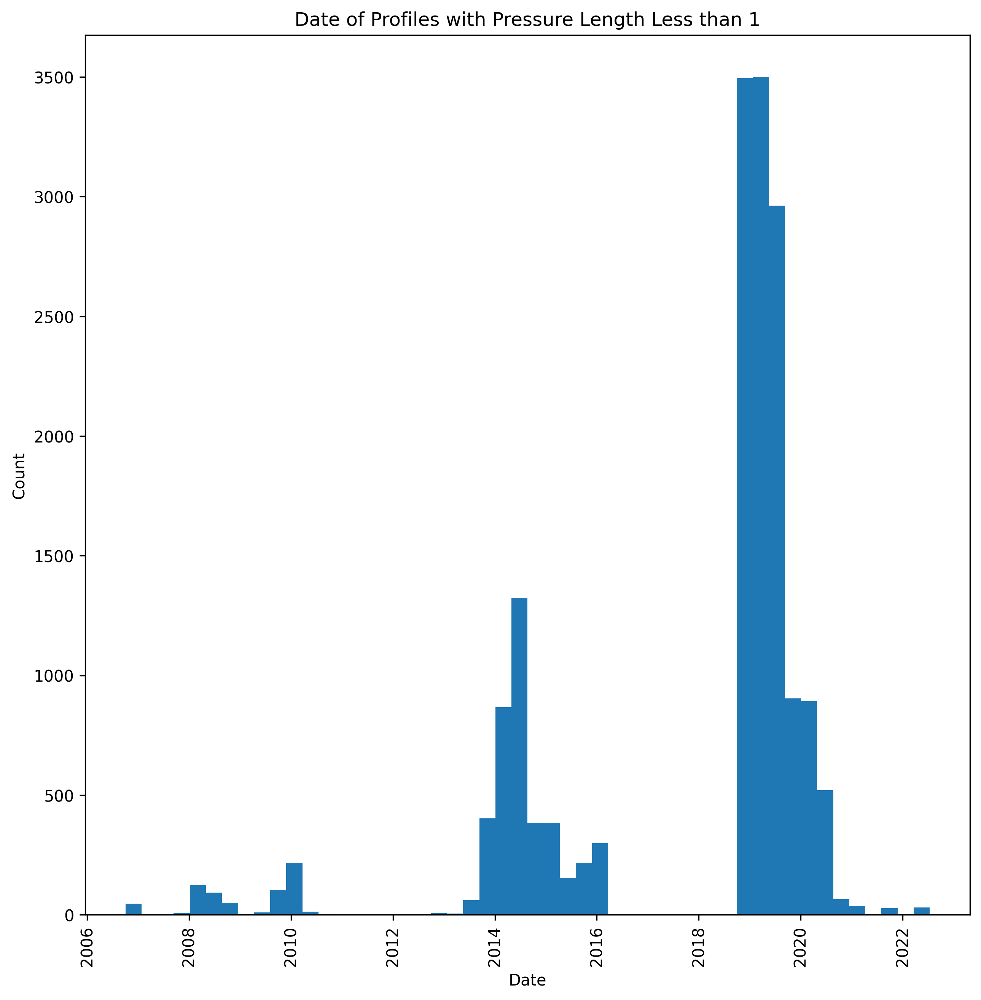

In [61]:
# if there are profiles with pressure length less than 1, plot a histogram of the date of those profiles
if len(df[df.larger_1 ==0]) > 0:
    plt.figure(figsize=(10, 10),dpi=300)
    plt.hist(df[df.larger_1 ==0].date, bins=50)
    plt.title('Date of Profiles with Pressure Length Less than 1')
    plt.xticks(rotation=90)  # rotate xtick labels 90 degrees
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.show()


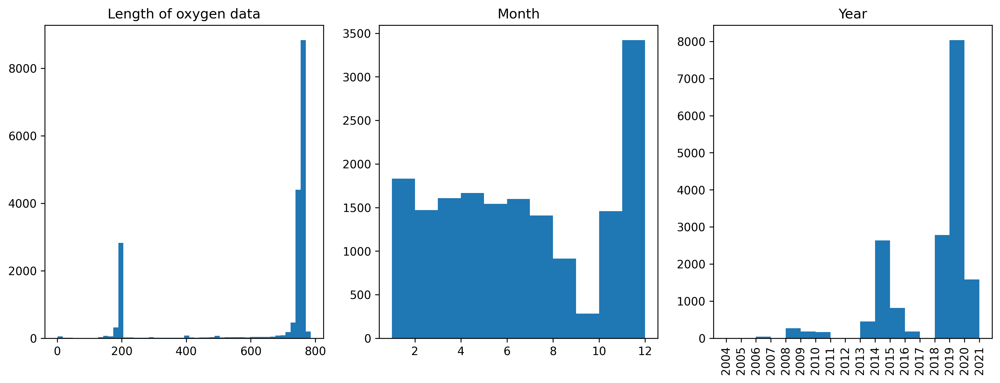

In [63]:
# if there is oxygen data, plot the distribution of the oxygen length using a histogram, and the date of the profiles with oxygen data side by side
if len(df[df.is_oxy == 1]) > 0:
    # covert the df.date to datetime
    df.date = pd.to_datetime(df.date)
    years = df[df.is_oxy == 1].date.dt.year.values
    months = df[df.is_oxy == 1].date.dt.month.values

    fig, axs = plt.subplots(1, 3, figsize=(15, 5),dpi=300)
    axs[0].hist(df[df.is_oxy == 1].oxy_len, bins=50)
    axs[0].set_title('Length of oxygen data')
    bins_month = np.arange(1, 13)  # set bin edges
    axs[1].hist(df[df.larger_1==0].date.dt.month.values, bins=bins_month)
    axs[1].set_title('Month')
    bins_year = np.arange(2004, 2022)  # set bin edges
    axs[2].hist(df[df.larger_1==0].date.dt.year.values, bins=bins_year)
    axs[2].set_xticks(bins_year)
    axs[2].set_xticklabels(bins_year, rotation=90) # rotate xticklabels by 90 degrees
    axs[2].set_title('Year')
    plt.show()
    # fig, ax = plt.subplots(1, 2, figsize=(15, 5),dpi=300)
    # ax[0].hist(df[df.is_oxy == 1].oxy_len, bins=50)
    # ax[0].set_title('Oxygen Length')
    # ax[1].hist(df[df.is_oxy == 1].date, bins=50)
    # ax[1].set_title('Date of Profiles with Oxygen Data')
    # plt.show()

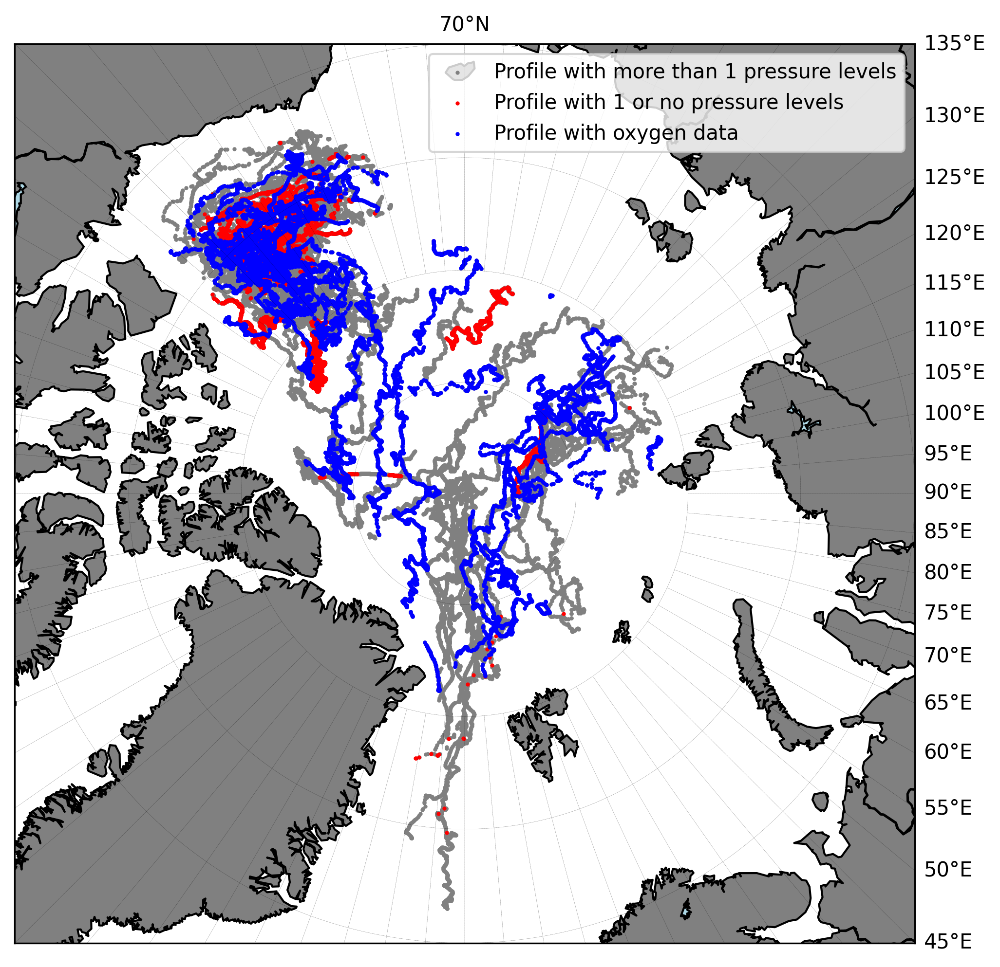

In [59]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

# Define the map bounds and resolution
lon_min, lon_max = -180, 180
lat_min, lat_max = 70, 90
latlon_step = 5
resolution = 'l'  # l for low resolution, h for high resolution

# Set up the figure and the Basemap instance
fig = plt.figure(figsize=(8,8),dpi=300)
m = Basemap(projection='npstere', boundinglat=lat_min, lon_0=0, resolution=resolution)

parallels = np.arange(lat_min, lat_max+1, 5)
meridians = np.arange(lon_min, lon_max+1, 5)

# m.drawparallels(parallels, labels=[True, False, False, False], linewidth=0.1)
# m.drawmeridians(meridians, labels=[False, False, False, True], linewidth=0.1)

m.drawparallels(np.arange(lat_min, lat_max+1, latlon_step), labels=[False,False,True,False], linewidth=0.1)
m.drawmeridians(np.arange(lon_min, lon_max+1, latlon_step), labels=[False,True,False,False], linewidth=0.1)


m.drawcoastlines()
m.fillcontinents(color='grey',lake_color='lightblue')

# plot lat lon distribution of the data with pressure length larger than 1
x, y = m(df.lon[df.larger_1==1].values, df.lat[df.larger_1==1].values)
m.scatter(x, y, 1, marker='o', color='grey',label='Profile with more than 1 pressure levels')

# plot lat lon distribution of the data with pressure length smaller than 1
x, y = m(df.lon[df.larger_1==0].values, df.lat[df.larger_1==0].values)
m.scatter(x, y, 1, marker='o', color='r',label='Profile with 1 or no pressure levels')

# plot lat lon distribution of the data with oxygen data
x, y = m(df.lon[df.is_oxy==1].values, df.lat[df.is_oxy==1].values)
m.scatter(x, y, 1, marker='o', color='b',label='Profile with oxygen data')

# plot the legend on top right
plt.legend(loc='upper right')

# Show the plot
plt.show()


# Data processing: merge the .dat files into .nc

## 1. The function to do the merge

In [5]:
# Define a function to process individual files
import pandas as pd
import xarray as xr
import numpy as np

def process_file(file,plevels):
    with open(file) as infile:
        metadata_names=infile.readline()
        metadata_vals=infile.readline().split()
    # print(metadata_vals)
    if metadata_vals[-1].isnumeric():
        if int(metadata_vals[-1])>1:
            ind=pd.read_csv(file,sep='\s+',header=2,engine='python',skipfooter=1,index_col=0)
            try:
                ds=ind.to_xarray().rename({'%pressure(dbar)':'pressure','temperature(C)':'temperature'})
                # ds = xr.Dataset({'pressure': ds['pressure'],'temperature': ds['temperature'],'salinity':ds['salinity']})
                # ds = xr.Dataset({'pressure': ds['pressure'],'temperature': ds['temperature'],'salinity':ds['salinity'],'dissolved_oxygen':ds['dissolved_oxygen']})

                if 'dissolved_oxygen' in ds:
                    ds = xr.Dataset({'pressure': ds['pressure'],'temperature': ds['temperature'],'salinity':ds['salinity'],'dissolved_oxygen':ds['dissolved_oxygen']})
                else:
                    # set the dissolved oxygen to be nan
                    ds = xr.Dataset({'pressure': ds['pressure'],'temperature': ds['temperature'],'salinity':ds['salinity'],'dissolved_oxygen':np.nan})
            # except KeyError:
            #     #return None
            #     print('cannot find dissolved oxygen')
            # try:
            #     ds=ind.to_xarray().rename({'%pressure(dbar)':'pressure','temperature(C)':'temperature'})
            #     ds = xr.Dataset({'pressure': ds['pressure'],'temperature': ds['temperature'],'salinity':ds['salinity']})
            except ValueError:
                return None

            ds=ds.assign_coords({'profiler': extract_string_from_file_path(file),#int(metadata_names.split(':')[0].split(',')[0].split(' ')[1]),
                                 'date':np.datetime64(pd.Timestamp(metadata_vals[0])+pd.Timedelta(float(metadata_vals[1]),'D')),
                                  'lon':float(metadata_vals[2]),
                                  'lat':float(metadata_vals[3])}
                                 )
            ds=ds.drop_duplicates('pressure',keep='last')
            # print(ds)
            # if not f_dxoy: 
            #     if 'dissolved_oxygen' in ds:
            #         ds=ds.drop('dissolved_oxygen')
            # else:
            #     if 'dissolved_oxygen' in ds:
            #         return ds
            
            if ds.pressure.size>1:    #ds['pressure'][-1].values>pend:
                return ds.interp({'pressure':plevels},assume_sorted=True) # interpolate the pressure levels
                
            else:
                print('pressure size is less than 2')
                return None
        else:
            print('less than 2 measurements')
            return None
    else:
        print('metadata vals is not numeric')
        return None

## 2. Call the function and get the data with cut-off pressure level of 750
### file names explained:
ds_all_oxy: data with dissolved oxygen with cut-off pressure level of 750\
ds_all_oxy_250: data with dissolved oxygen with cut-off pressure level of 250\
\
ds_cleaned_750: cleaned data with dissolved oxygen with cut-off pressure level of 750\
ds_cleaned_250: cleaned data with dissolved oxygen with cut-off pressure level of 250

In [16]:
# get the data with pressure ranging from 10 to 750 dbar
import glob
import numpy as np
import pandas as pd
import xarray as xr

files = glob.glob(f'{data_path}/*.dat')
print(f'Total {len(files)} files found.')

pstart=10
pend=750.
plevels=np.arange(pstart,pend,5.)

# define a list to hold the individual xarray datasets
datasets = []

counter=0
k=0
for file in files:
    ds = process_file(file,plevels)
    k=k+1
    if ds is not None:
        datasets.append(ds)
        # counter=counter+1
        # # print(f'Processed {counter} files.')
        # if counter==1000:
        #     # print(datasets)
        #     print(f'in k={k}')
        #     break # <-- this line breaks the loop after the first dataset is processed



Total 106013 files found.
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements

In [13]:
datasets

[<xarray.Dataset>
 Dimensions:           (pressure: 148)
 Coordinates:
     profiler          <U13 'itp100grd0001'
     date              datetime64[ns] 2017-09-20T00:02:04.416000
     lon               float64 -149.2
     lat               float64 80.04
   * pressure          (pressure) float64 10.0 15.0 20.0 ... 735.0 740.0 745.0
 Data variables:
     temperature       (pressure) float64 -1.495 -1.495 -1.342 ... 0.3416 0.3286
     salinity          (pressure) float64 27.8 27.81 28.08 ... 34.86 34.86 34.86
     dissolved_oxygen  (pressure) float64 378.7 378.7 378.4 ... 298.7 298.8 299.5,
 <xarray.Dataset>
 Dimensions:           (pressure: 148)
 Coordinates:
     profiler          <U13 'itp100grd0002'
     date              datetime64[ns] 2017-09-20T06:02:01.824000
     lon               float64 -149.1
     lat               float64 80.07
   * pressure          (pressure) float64 10.0 15.0 20.0 ... 735.0 740.0 745.0
 Data variables:
     temperature       (pressure) float64 nan nan nan

In [17]:
# # concatenate the individual xarray datasets into a single xarray dataset
ds_all_oxy = xr.concat(datasets, dim='nprof')
ds_all_oxy


<xarray.Dataset>
Dimensions:           (nprof: 88774, pressure: 148)
Coordinates:
    profiler          (nprof) <U13 'itp100grd0001' ... 'itp9grd1100'
    date              (nprof) datetime64[ns] 2017-09-20T00:02:04.416000 ... 2...
    lon               (nprof) float64 -149.2 -149.1 -148.8 ... -95.29 -95.09
    lat               (nprof) float64 80.04 80.07 80.1 ... 82.75 82.76 82.76
  * pressure          (pressure) float64 10.0 15.0 20.0 ... 735.0 740.0 745.0
Dimensions without coordinates: nprof
Data variables:
    temperature       (nprof, pressure) float64 -1.495 -1.495 ... 0.231 0.2258
    salinity          (nprof, pressure) float64 27.8 27.81 28.08 ... 34.88 34.88
    dissolved_oxygen  (nprof, pressure) float64 378.7 378.7 378.4 ... nan nan

In [18]:
# save the xarry to local file
ds_all_oxy.to_netcdf(f"{data_path}/ds_all_oxy.nc")

In [12]:
# read the xarray from local file
import xarray as xr
ds_all_oxy=xr.open_dataset(f"{data_path}/ds_all_oxy.nc")
ds_all_oxy['pressure']=-ds_all_oxy['pressure']
ds_all_oxy['profiler'] = ds_all_oxy['profiler'].astype('str')
ds_all_oxy

<xarray.Dataset>
Dimensions:           (nprof: 88774, pressure: 148)
Coordinates:
    profiler          (nprof) <U13 'itp100grd0001' ... 'itp9grd1100'
    date              (nprof) datetime64[ns] ...
    lon               (nprof) float64 ...
    lat               (nprof) float64 ...
  * pressure          (pressure) float64 -10.0 -15.0 -20.0 ... -740.0 -745.0
Dimensions without coordinates: nprof
Data variables:
    temperature       (nprof, pressure) float64 ...
    salinity          (nprof, pressure) float64 ...
    dissolved_oxygen  (nprof, pressure) float64 ...

## 3. Call the function and get the data with cut-off pressure level of **250**

In [6]:
# get the data with pressure ranging from 10 to 250 dbar
import glob
import numpy as np
import pandas as pd
import xarray as xr

files = glob.glob(f'{data_path}/*.dat')
print(f'Total {len(files)} files found.')

pstart=10
pend=250.
plevels=np.arange(pstart,pend,5.)

# define a list to hold the individual xarray datasets
datasets = []

counter=0
k=0
for file in files:
    ds = process_file(file,plevels)
    k=k+1
    if ds is not None:
        datasets.append(ds)
        # counter=counter+1
        # # print(f'Processed {counter} files.')
        # if counter==1000:
        #     # print(datasets)
        #     print(f'in k={k}')
        #     break # <-- this line breaks the loop after the first dataset is processed

# # concatenate the individual xarray datasets into a single xarray dataset
ds_all_oxy_250 = xr.concat(datasets, dim='nprof')

# save the xarry to local file
ds_all_oxy_250.to_netcdf(f"{data_path}/ds_all_oxy_250.nc")

Total 106013 files found.
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements
less than 2 measurements

In [18]:
# read the xarray from local file
import xarray as xr
ds_all_oxy_250=xr.open_dataset(f"{data_path}/ds_all_oxy_250.nc")
ds_all_oxy_250['pressure']=-ds_all_oxy_250['pressure']
ds_all_oxy_250['profiler'] = ds_all_oxy_250['profiler'].astype('str')
ds_all_oxy_250

<xarray.Dataset>
Dimensions:           (nprof: 88774, pressure: 48)
Coordinates:
    profiler          (nprof) <U13 'itp100grd0001' ... 'itp9grd1100'
    date              (nprof) datetime64[ns] ...
    lon               (nprof) float64 ...
    lat               (nprof) float64 ...
  * pressure          (pressure) float64 -10.0 -15.0 -20.0 ... -240.0 -245.0
Dimensions without coordinates: nprof
Data variables:
    temperature       (nprof, pressure) float64 ...
    salinity          (nprof, pressure) float64 ...
    dissolved_oxygen  (nprof, pressure) float64 ...

## 4. Clean the data by remove nan and outlier, for cut-off pressure 750
Note that the cleaning is not performed to the variable 'dissolved_oxygen'

In [15]:
# select a pressure range
pstart=-10.
pend=-750.

# drop NaN values while ignoring the 'dissolved_oxygen' variable
ds_cleaned_750 = ds_all_oxy.sel(pressure=slice(pstart,pend)).dropna(dim='nprof', subset=['temperature', 'salinity'])
#ds_cleaned_750=ds_all_oxy.sel(pressure=slice(pstart,pend)).dropna('nprof')
ds_cleaned_750

<xarray.Dataset>
Dimensions:           (nprof: 44692, pressure: 148)
Coordinates:
    profiler          (nprof) <U13 'itp100grd0001' ... 'itp9grd1097'
    date              (nprof) datetime64[ns] ...
    lon               (nprof) float64 ...
    lat               (nprof) float64 ...
  * pressure          (pressure) float64 -10.0 -15.0 -20.0 ... -740.0 -745.0
Dimensions without coordinates: nprof
Data variables:
    temperature       (nprof, pressure) float64 -1.495 -1.495 ... 0.2263 0.2201
    salinity          (nprof, pressure) float64 27.8 27.81 28.08 ... 34.88 34.88
    dissolved_oxygen  (nprof, pressure) float64 ...

In [16]:
# save the cleaned xarry to local file
ds_cleaned_750.to_netcdf(f"{data_path}/ds_cleaned_750.nc")

In [5]:
# read the cleaned xarray from local file
import xarray as xr
ds_cleaned_750=xr.open_dataset(f"{data_path}/ds_cleaned_750.nc")
ds_cleaned_750

<xarray.Dataset>
Dimensions:           (nprof: 44692, pressure: 148)
Coordinates:
    profiler          (nprof) object ...
    date              (nprof) datetime64[ns] ...
    lon               (nprof) float64 ...
    lat               (nprof) float64 ...
  * pressure          (pressure) float64 -10.0 -15.0 -20.0 ... -740.0 -745.0
Dimensions without coordinates: nprof
Data variables:
    temperature       (nprof, pressure) float64 ...
    salinity          (nprof, pressure) float64 ...
    dissolved_oxygen  (nprof, pressure) float64 ...

In [2]:
import matplotlib.pyplot as plt
import numpy as np

def profile_check(ds_cleaned):
    fig, axs = plt.subplots(1, 3, figsize=(10, 5), dpi=300)

    # Extract the data
    temperatures = ds_cleaned['temperature'].values[:, :]
    salinities = ds_cleaned['salinity'].values[:, :]
    pressures = ds_cleaned['pressure'].values

    # Plot temperature profiles
    axs[0].plot(temperatures.T, pressures)
    axs[0].set_xlabel('Temperature')
    axs[0].set_ylabel('Pressure')

    # Plot salinity profiles
    axs[1].plot(salinities.T, pressures)
    axs[1].set_xlabel('Salinity')
    axs[1].set_ylabel('Pressure')

    # plot the dissolved oxygen profiles
    if 'dissolved_oxygen' in ds_cleaned:
        dissolved_oxygen = ds_cleaned['dissolved_oxygen'].values[:, :]
        axs[2].plot(dissolved_oxygen.T, pressures)
        axs[2].set_xlabel('Dissolved Oxygen')
        axs[2].set_ylabel('Pressure')

    plt.show()


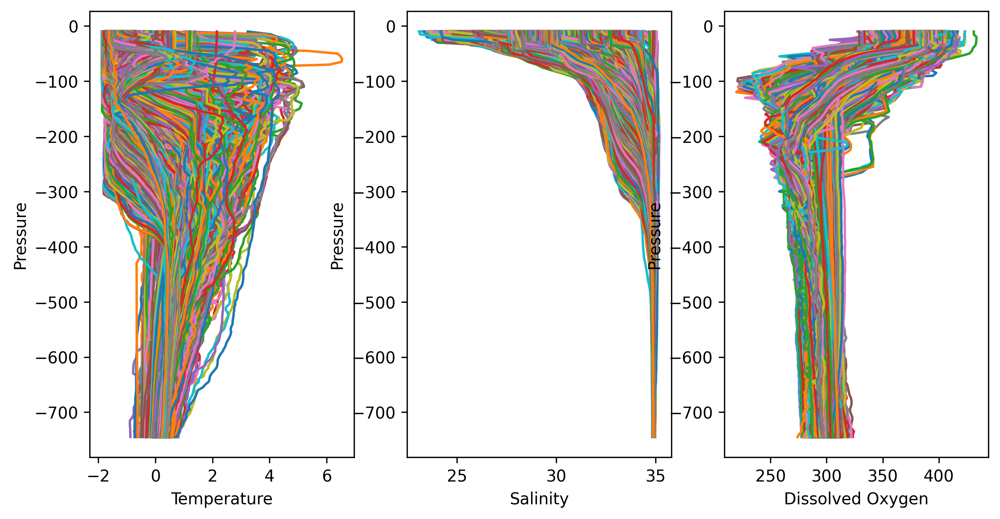

In [7]:
profile_check(ds_cleaned_750)

## 5. Clean the data by remove nan and outlier, for cut-off pressure 250

In [19]:
# select a pressure range
pstart=-10.
pend=-250.

# drop NaN values while ignoring the 'dissolved_oxygen' variable
ds_cleaned_250 = ds_all_oxy_250.sel(pressure=slice(pstart,pend)).dropna(dim='nprof', subset=['temperature', 'salinity'])
#ds_cleaned_750=ds_all_oxy.sel(pressure=slice(pstart,pend)).dropna('nprof')
ds_cleaned_250

<xarray.Dataset>
Dimensions:           (nprof: 67040, pressure: 48)
Coordinates:
    profiler          (nprof) <U13 'itp100grd0001' ... 'itp9grd1099'
    date              (nprof) datetime64[ns] ...
    lon               (nprof) float64 ...
    lat               (nprof) float64 ...
  * pressure          (pressure) float64 -10.0 -15.0 -20.0 ... -240.0 -245.0
Dimensions without coordinates: nprof
Data variables:
    temperature       (nprof, pressure) float64 -1.495 -1.495 ... -0.2547
    salinity          (nprof, pressure) float64 27.8 27.81 28.08 ... 34.45 34.47
    dissolved_oxygen  (nprof, pressure) float64 ...

In [18]:
# save the cleaned xarry to local file
ds_cleaned_250.to_netcdf(f"{data_path}/ds_cleaned_250.nc")
# ds_cleaned_250.to_netcdf("ds_cleaned_250.nc")

In [3]:
# read the cleaned xarray from local file
import xarray as xr
ds_cleaned_250=xr.open_dataset(f"{data_path}/ds_cleaned_250.nc")
# convert the profile data to string
ds_cleaned_250['profiler']=ds_cleaned_250['profiler'].astype(str)

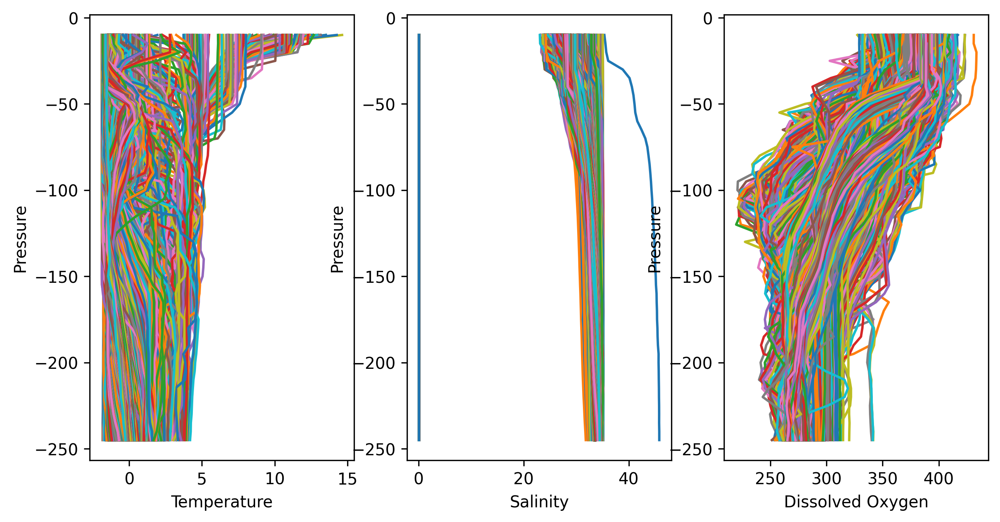

In [14]:
profile_check(ds_cleaned_250)

In [15]:
# # find the salinity data that larger than 40 and <5 delete them

pro_index=np.where(ds_cleaned_250['salinity']>40)
if pro_index[0].size>0:
    pro_index=np.unique(pro_index[0])
    pro_index=ds_cleaned_250['nprof'][pro_index].values
    print(f'nprof= {pro_index} with salinity>40, excluded')
    # drop the profile with salinity>40
    ds_cleaned_250=ds_cleaned_250.drop_sel(nprof=pro_index)



pro_index=np.where(ds_cleaned_250['salinity']<5)
if pro_index[0].size>0:
    pro_index=np.unique(pro_index[0])
    pro_index=ds_cleaned_250['nprof'][pro_index].values
    print(f'nprof= {pro_index} with salinity<5, excluded')
    # drop the profile with salinity>40
    ds_cleaned_250=ds_cleaned_250.drop_sel(nprof=pro_index)

nprof= [37150] with salinity>40, excluded
nprof= [32506 32507 32508 32509 32510 32511 32512 32513 32514 32515 32516 32517
 32518 32519 32520 32521 32522 32523 32524 32525 32526 32527 32528 32529
 32530 32531 32532 32533 32534 32535 32536 32537 32538 32539 32540 32541
 32542 32543 32544 32545 32546 32547 32548 32549 32550 32551 32552 32553
 32554 32555 32556 32557 32558 32559 32560 32561 32562 32563 32564 32565
 32566 32567 32568 32569 32570 32571 32572 32573 32574 32575 32576 32577
 32578 32579 32580 32581 32582 32583 32584 32585 32586 32587 32588 32589
 32590 32591 32592 32593 32594 32595 32596 32597 32598 32599 32600 32601
 32602 32603 32604 32605 32606 32607 32608 32609 32610 32611 32612 32613
 32614 32615 32616 32617 32618 32619 32620 32621 32622 32623 32624 32625
 32626 32627 32628 32629 32630 32631 32632 32633 32634 32635 32636 32637
 32638 32639 32640 32641 32642 32643 32644 32645 32646 32647 32648 32649
 32650 32651 32652 32653 32654 32655 32656 32657 32658 32659 32660 32661
 3

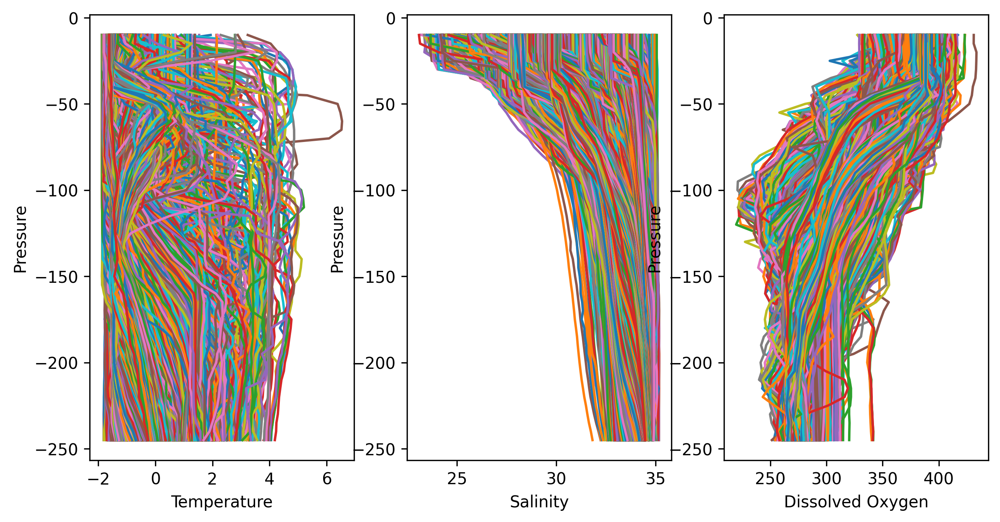

In [4]:
profile_check(ds_cleaned_250)